## MUSI - Image Analysis 

### Crowd Counting Project

### Imports

In [29]:
import os

import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from src.utils import read_annotations_data, show_data_distribution, plot_validation_results

### Data Loading

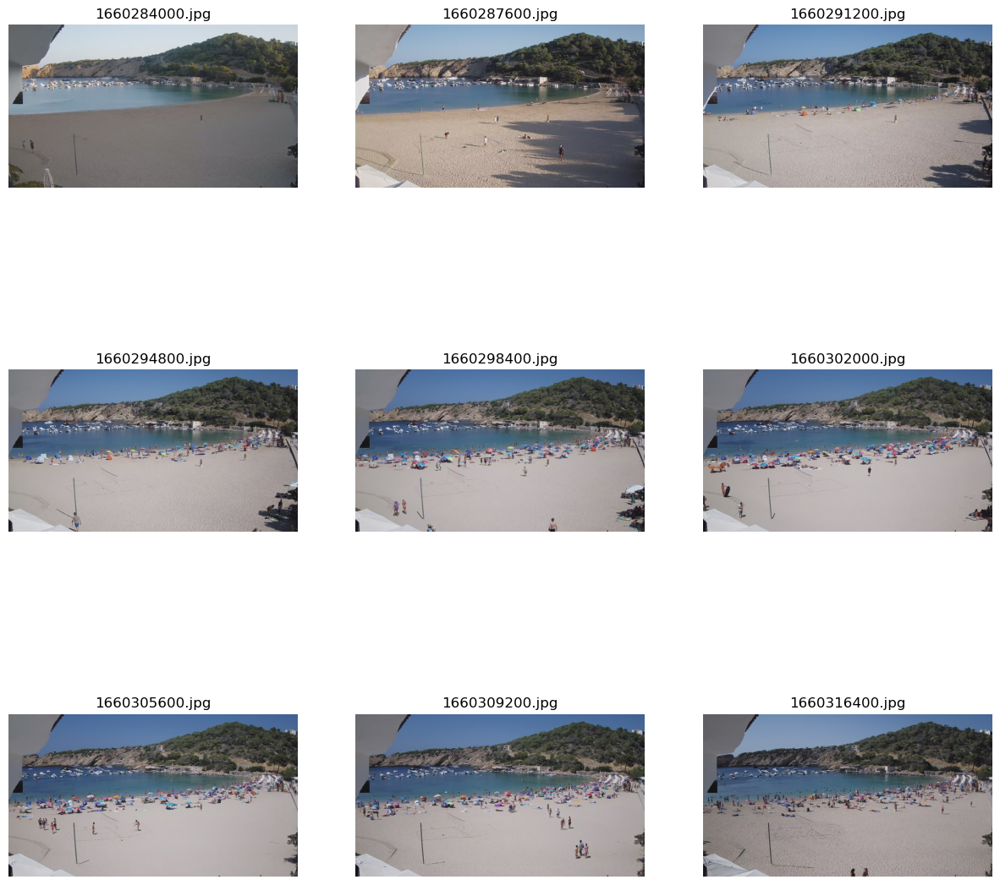

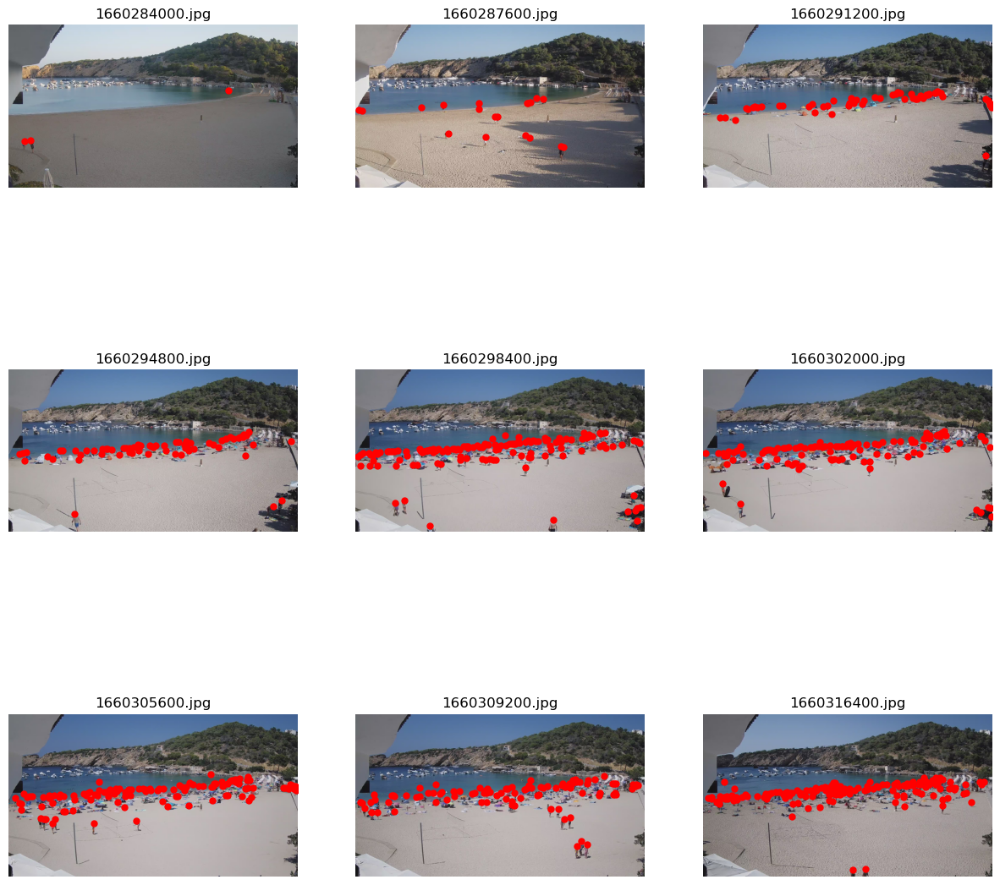

In [2]:
annotations = read_annotations_data('./data', show_img=True, show_annotations=True)

### Data Distribution

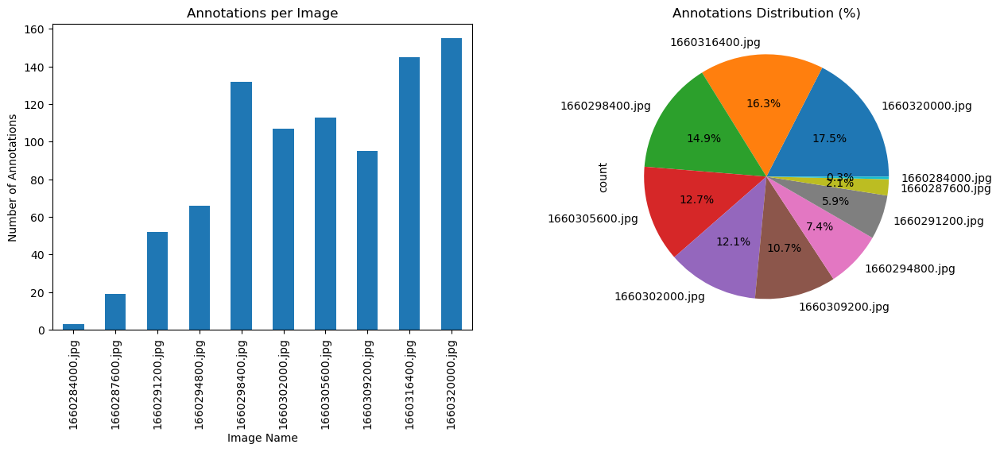

In [3]:
show_data_distribution(annotations)

## Techniques

### Contour Detection

In [4]:
from src.ContourDetection import ContourDetector

In [5]:
contour_detector = ContourDetector(manual_annotations=annotations)

In [6]:
# Set show_image to True to see the images as they are processed
contour_predictions = contour_detector.process_images(show_image=False)

/Users/farouq/Documents/School/UIB/CV - Image and Video Analysis/exercises/crowd_counting/src/PerformanceMonitor.py:27: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  self.metrics = pd.concat([self.metrics, new_row], ignore_index=True)


In [7]:
contour_detector.metrics

,function,image_name,time_took,cpu_cycles,memory_usage,memory_peak
0,_process_image,1660287600.jpg,0.020750,0.05,35.984375 MB,53.91768 MB
1,_process_image,1660291200.jpg,0.020398,0.05,0.5 MB,53.914936 MB
2,_process_image,1660294800.jpg,0.022221,0.06,1.5 MB,53.914936 MB
3,_process_image,1660298400.jpg,0.022142,0.00,0.140625 MB,53.914424 MB
4,_process_image,1660302000.jpg,0.021253,0.00,0.203125 MB,53.914424 MB
5,_process_image,1660305600.jpg,0.022846,0.00,0.1875 MB,53.914424 MB
6,_process_image,1660309200.jpg,0.021302,0.00,0.5 MB,53.914424 MB
7,_process_image,1660316400.jpg,0.024112,0.00,0.078125 MB,53.914424 MB
8,_process_image,1660320000.jpg,0.022519,0.00,0.21875 MB,53.914424 MB


In [8]:
contour_image_eval, contour_mean_mse = contour_detector.image_level_validation()

In [9]:
print("Image Level Validation: ", end="\n\n")
print(contour_image_eval)
print("Mean MSE: ", contour_mean_mse)

Image Level Validation: 

  image_id  people  people_gt      image_name     mse     %\error
0  image_0     0.0          3  1660284000.jpg     9.0  100.000000
1  image_1    70.0         19  1660287600.jpg  2601.0  268.421053
2  image_2    63.0         52  1660291200.jpg   121.0   21.153846
3  image_3    88.0         66  1660294800.jpg   484.0   33.333333
4  image_4   109.0        132  1660298400.jpg   529.0   17.424242
5  image_5   131.0        107  1660302000.jpg   576.0   22.429907
6  image_6   122.0        113  1660305600.jpg    81.0    7.964602
7  image_7   101.0         95  1660309200.jpg    36.0    6.315789
8  image_8   145.0        145  1660316400.jpg     0.0    0.000000
9  image_9   156.0        155  1660320000.jpg     1.0    0.645161
Mean MSE:  443.8


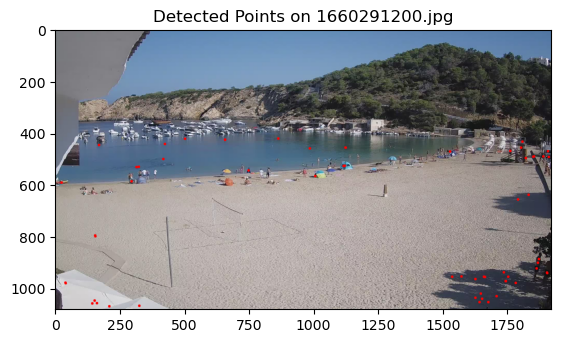

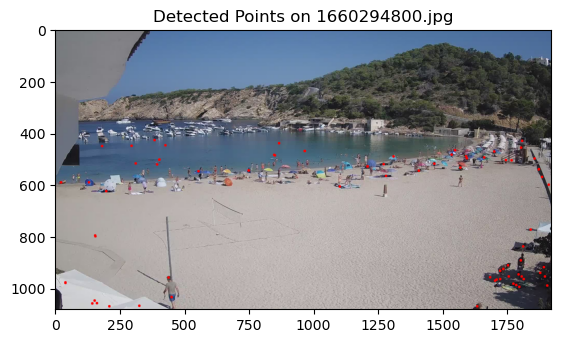

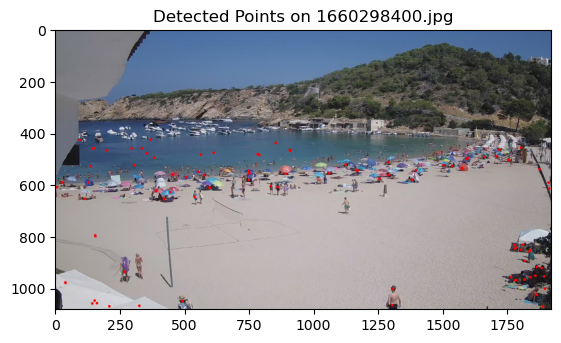

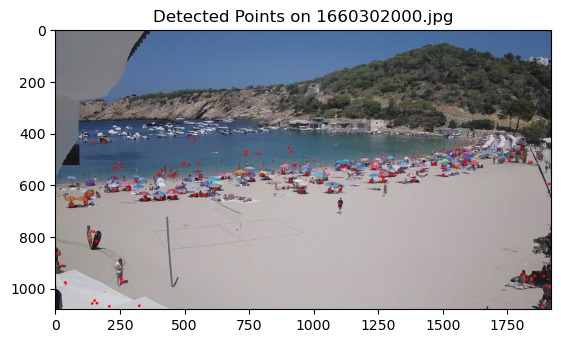

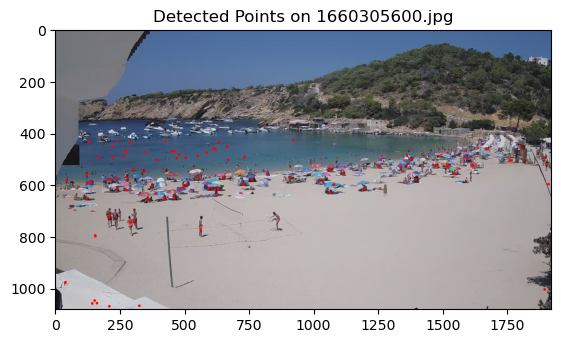

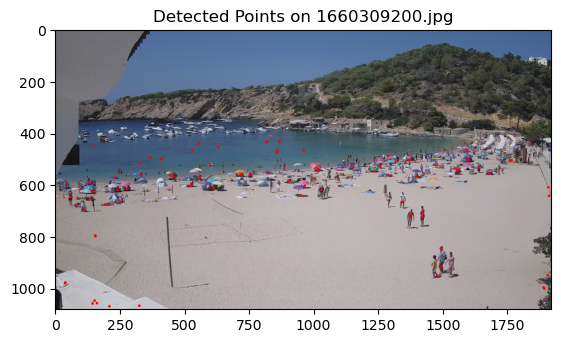

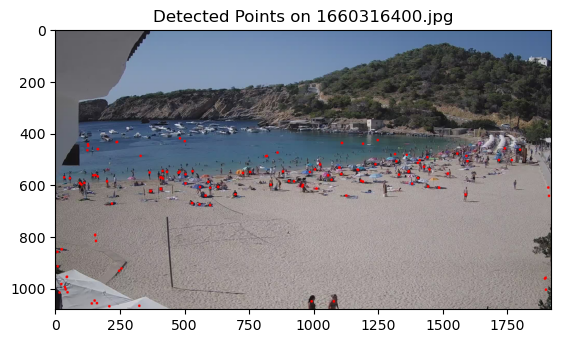

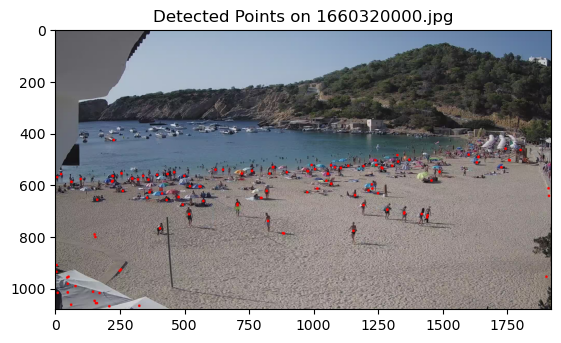

In [10]:
contour_person_eval = contour_detector.person_level_validation(show_images=True)

In [11]:
contour_person_eval

,image_name,tp,fp,fn,precision,recall,f1score,accuracy
0,1660291200.jpg,7,56,45,0.111111,0.134615,0.121739,0.064815
1,1660294800.jpg,6,82,60,0.068182,0.090909,0.077922,0.040541
2,1660298400.jpg,29,80,103,0.266055,0.219697,0.240664,0.136792
3,1660302000.jpg,25,106,82,0.190840,0.233645,0.210084,0.117371
4,1660305600.jpg,30,92,83,0.245902,0.265487,0.255319,0.146341
5,1660309200.jpg,20,81,75,0.198020,0.210526,0.204082,0.113636
6,1660316400.jpg,41,104,104,0.282759,0.282759,0.282759,0.164659
7,1660320000.jpg,40,116,115,0.256410,0.258065,0.257235,0.147601


In [12]:
print(f"Average precision: {contour_person_eval['precision'].mean() * 100:.2f}%")
print(f"Average recall: {contour_person_eval['recall'].mean() * 100:.2f}%")
print(f"Average accuracy: {contour_person_eval['accuracy'].mean() * 100:.2f}%")
print(f"Average F1 score: {contour_person_eval['f1score'].mean() * 100:.2f}%")
print(f"Total true-positives: {contour_person_eval['tp'].sum()}")

Average precision: 20.24%
Average recall: 21.20%
Average accuracy: 11.65%
Average F1 score: 20.62%
Total true-positives: 198


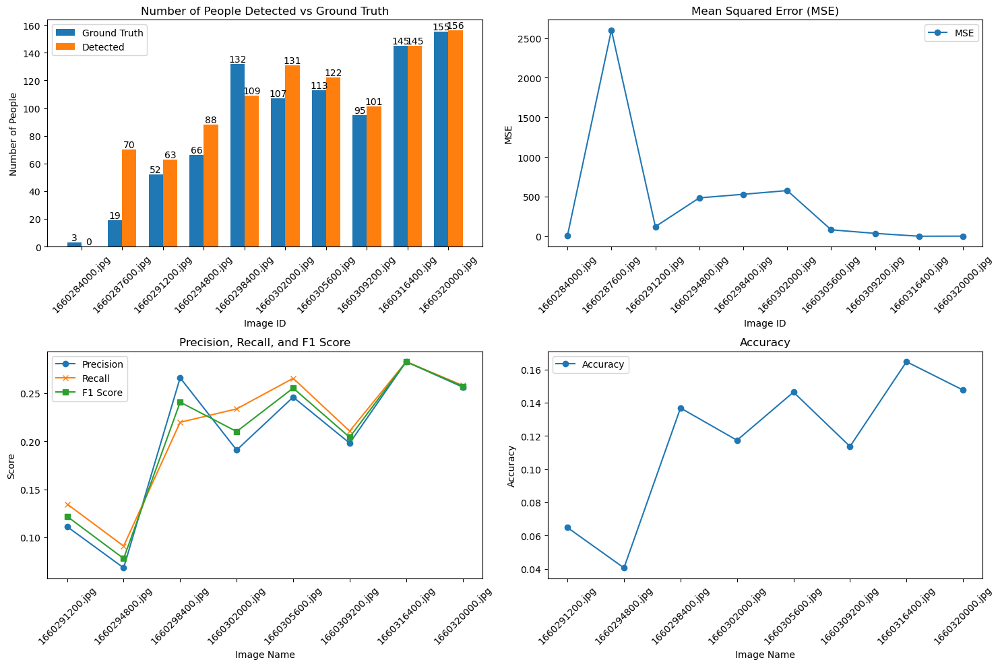

In [13]:
plot_validation_results(contour_image_eval, contour_person_eval)

### Connected Components Detection

In [14]:
from src.ConnectedComponents import ConnectedComponents

In [15]:
connected = ConnectedComponents(manual_annotations=annotations)

In [16]:
# Set show_image to True to see the images as they are processed
connected_predictions = connected.process_images(show_image=False)

/Users/farouq/Documents/School/UIB/CV - Image and Video Analysis/exercises/crowd_counting/src/PerformanceMonitor.py:27: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  self.metrics = pd.concat([self.metrics, new_row], ignore_index=True)


In [17]:
connected.metrics

,function,image_name,time_took,cpu_cycles,memory_usage,memory_peak
0,_process_image,1660287600.jpg,0.059802,0.19,1.640625 MB,16.59036 MB
1,_process_image,1660291200.jpg,0.056695,0.19,0.03125 MB,16.589736 MB
2,_process_image,1660294800.jpg,0.059357,0.18,0.03125 MB,16.589736 MB
3,_process_image,1660298400.jpg,0.059944,0.00,0.015625 MB,16.589736 MB
4,_process_image,1660302000.jpg,0.061094,0.00,0.0 MB,16.589736 MB
5,_process_image,1660305600.jpg,0.058039,0.00,0.015625 MB,16.589736 MB
6,_process_image,1660309200.jpg,0.058012,0.00,0.515625 MB,16.589736 MB
7,_process_image,1660316400.jpg,0.056270,0.00,0.046875 MB,16.589736 MB
8,_process_image,1660320000.jpg,0.060301,0.00,0.015625 MB,16.589736 MB


In [18]:
connected_image_eval, connected_mean_mse = connected.image_level_validation()

In [19]:
print("Image Level Validation: ", end="\n\n")
print(connected_image_eval)
print("Mean MSE: ", connected_mean_mse)

Image Level Validation: 

  image_id  people  people_gt      image_name     mse     %\error
0  image_0     0.0          3  1660284000.jpg     9.0  100.000000
1  image_1    31.0         19  1660287600.jpg   144.0   63.157895
2  image_2    42.0         52  1660291200.jpg   100.0   19.230769
3  image_3    75.0         66  1660294800.jpg    81.0   13.636364
4  image_4   105.0        132  1660298400.jpg   729.0   20.454545
5  image_5   115.0        107  1660302000.jpg    64.0    7.476636
6  image_6   107.0        113  1660305600.jpg    36.0    5.309735
7  image_7   103.0         95  1660309200.jpg    64.0    8.421053
8  image_8   110.0        145  1660316400.jpg  1225.0   24.137931
9  image_9   118.0        155  1660320000.jpg  1369.0   23.870968
Mean MSE:  382.1


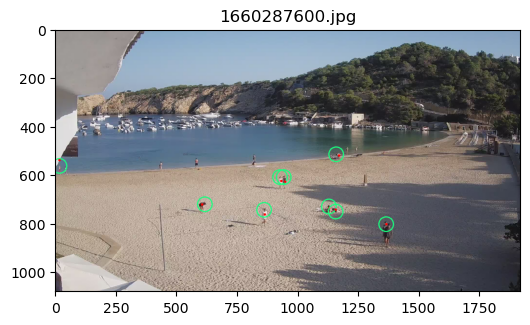

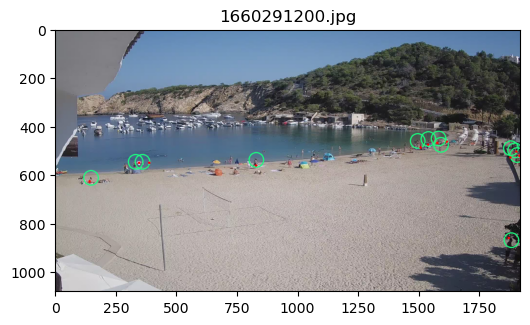

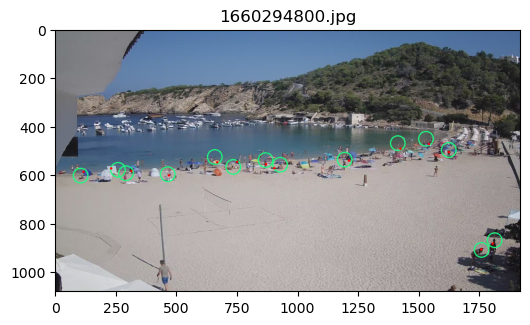

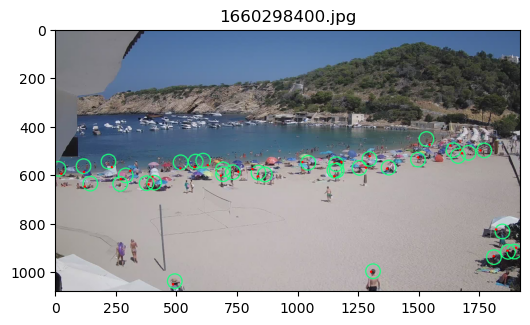

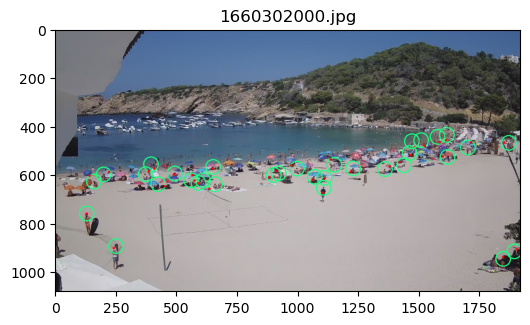

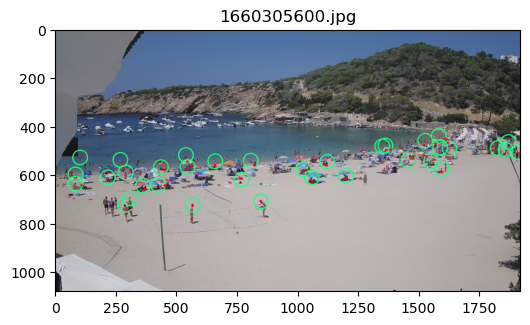

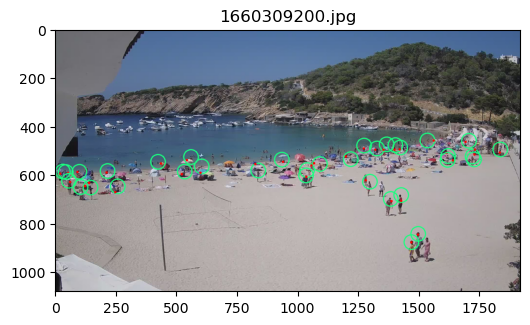

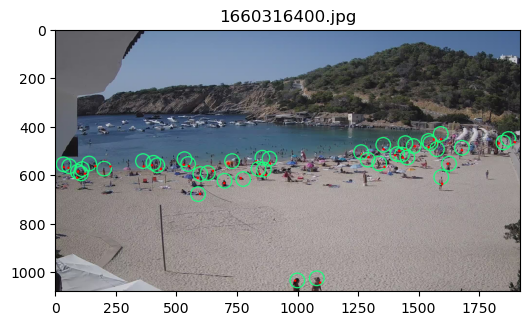

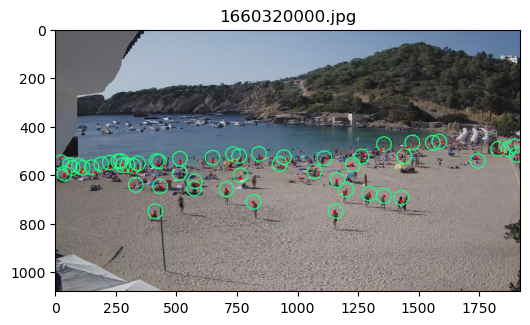

In [20]:
connected_person_eval = connected.person_level_validation(radius=30, show_images=True)

In [21]:
connected_person_eval

,image_name,tp,fp,fn,precision,recall,f1score,accuracy
image_1,1660287600.jpg,9,22,10,0.290323,0.473684,0.360000,0.219512
image_2,1660291200.jpg,12,30,40,0.285714,0.230769,0.255319,0.146341
image_3,1660294800.jpg,14,61,52,0.186667,0.212121,0.198582,0.110236
image_4,1660298400.jpg,35,70,97,0.333333,0.265152,0.295359,0.173267
image_5,1660302000.jpg,33,82,74,0.286957,0.308411,0.297297,0.174603
image_6,1660305600.jpg,35,72,78,0.327103,0.309735,0.318182,0.189189
image_7,1660309200.jpg,35,68,60,0.339806,0.368421,0.353535,0.214724
image_8,1660316400.jpg,42,68,103,0.381818,0.289655,0.329412,0.197183
image_9,1660320000.jpg,53,65,102,0.449153,0.341935,0.388278,0.240909


In [22]:
print(f"Average precision: {connected_person_eval['precision'].mean() * 100:.2f}%")
print(f"Average recall: {connected_person_eval['recall'].mean() * 100:.2f}%")
print(f"Average accuracy: {connected_person_eval['accuracy'].mean() * 100:.2f}%")
print(f"Average F1 score: {connected_person_eval['f1score'].mean() * 100:.2f}%")
print(f"Total true-positives: {connected_person_eval['tp'].sum()}")

Average precision: 32.01%
Average recall: 31.11%
Average accuracy: 18.51%
Average F1 score: 31.07%
Total true-positives: 268


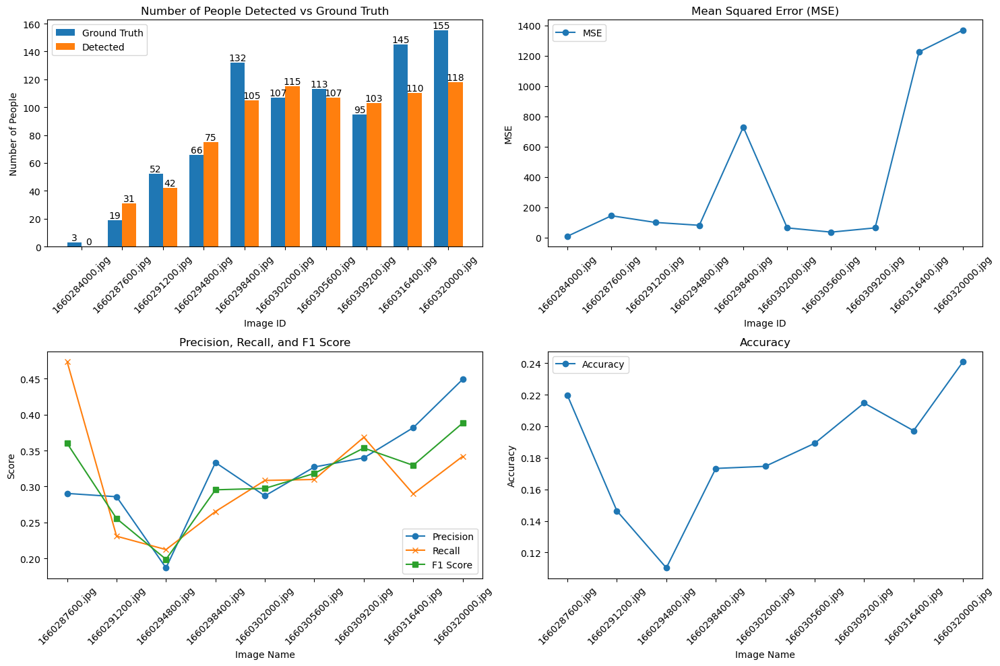

In [23]:
plot_validation_results(connected_image_eval, connected_person_eval)

### Comparison with Deep Learning - YOLO

In [24]:
from ultralytics import YOLO

In [25]:
model = YOLO('yolov8m.pt')  
classes = [0]


0: 384x640 12 persons, 184.2ms
Speed: 3.8ms preprocess, 184.2ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 persons, 146.6ms
Speed: 1.5ms preprocess, 146.6ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 persons, 141.2ms
Speed: 2.1ms preprocess, 141.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 persons, 141.0ms
Speed: 1.9ms preprocess, 141.0ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 persons, 145.2ms
Speed: 2.1ms preprocess, 145.2ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 persons, 139.0ms
Speed: 1.7ms preprocess, 139.0ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 persons, 140.9ms
Speed: 1.8ms preprocess, 140.9ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 persons, 141.4ms
Speed: 1.7ms preprocess, 141.4ms inference, 0.6ms postprocess p

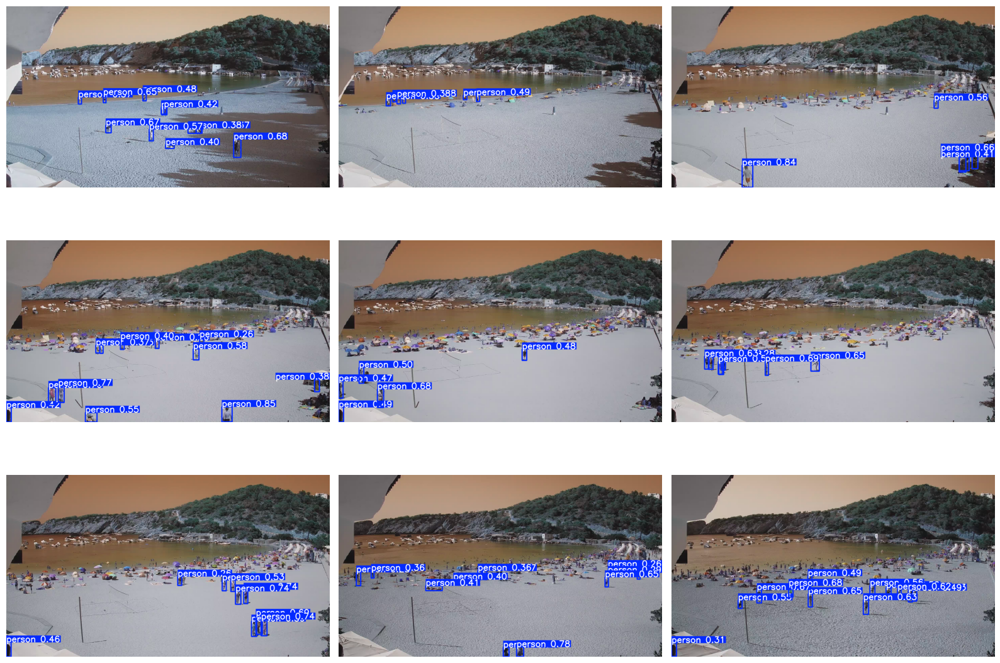

In [27]:
yolo_preds = {}

fig, axs = plt.subplots(3, 3, figsize=(16, 12))
for idx, (ax, row) in enumerate(zip(axs.flatten(), annotations['image_name'].unique()[1:]), start=1):
    img_path = os.path.join('./data', row)
    img = cv2.imread(img_path)
    img_yolo = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    results = model(img_yolo, classes=classes)
    annotated_img = results[0].plot() 
    yolo_preds[row] = results[0].boxes.xywh.shape[0]
    
    ax.imshow(cv2.cvtColor(annotated_img, cv2.COLOR_BGR2RGB))
    ax.axis('off')
    
plt.tight_layout()
plt.show()

In [ ]:
combined_eval = pd.merge(contour_image_eval, connected_image_eval, on='image_name', suffixes=('_contour', '_connected'))

yolo_preds_df = pd.DataFrame(list(yolo_preds.items()), columns=['image_name', 'people_yolo'])

final_combined_eval = pd.merge(combined_eval, yolo_preds_df, on='image_name')
final_combined_eval = final_combined_eval.drop(columns=['image_id_connected', 'people_gt_connected'])
final_combined_eval = final_combined_eval.rename(columns={'people_gt_contour': 'people_gt', 'image_id_contour': 'image_id'})

combined_eval_cols = ['image_name', 'image_id', 'people_gt', 'people_contour', 'mse_contour', 'people_connected', 'mse_connected', 'people_yolo']

final_combined_eval = final_combined_eval[combined_eval_cols]
final_combined_eval['mse_yolo'] = np.power(final_combined_eval['people_yolo'] - final_combined_eval['people_gt'], 2)

final_combined_eval

,image_name,image_id,people_gt,people_contour,mse_contour,people_connected,mse_connected,people_yolo,mse_yolo
0,1660287600.jpg,image_1,19,70.0,2601.0,31.0,144.0,12,49
1,1660291200.jpg,image_2,52,63.0,121.0,42.0,100.0,6,2116
2,1660294800.jpg,image_3,66,88.0,484.0,75.0,81.0,5,3721
3,1660298400.jpg,image_4,132,109.0,529.0,105.0,729.0,12,14400
4,1660302000.jpg,image_5,107,131.0,576.0,115.0,64.0,5,10404
5,1660305600.jpg,image_6,113,122.0,81.0,107.0,36.0,7,11236
6,1660309200.jpg,image_7,95,101.0,36.0,103.0,64.0,9,7396
7,1660316400.jpg,image_8,145,145.0,0.0,110.0,1225.0,11,17956
8,1660320000.jpg,image_9,155,156.0,1.0,118.0,1369.0,12,20449


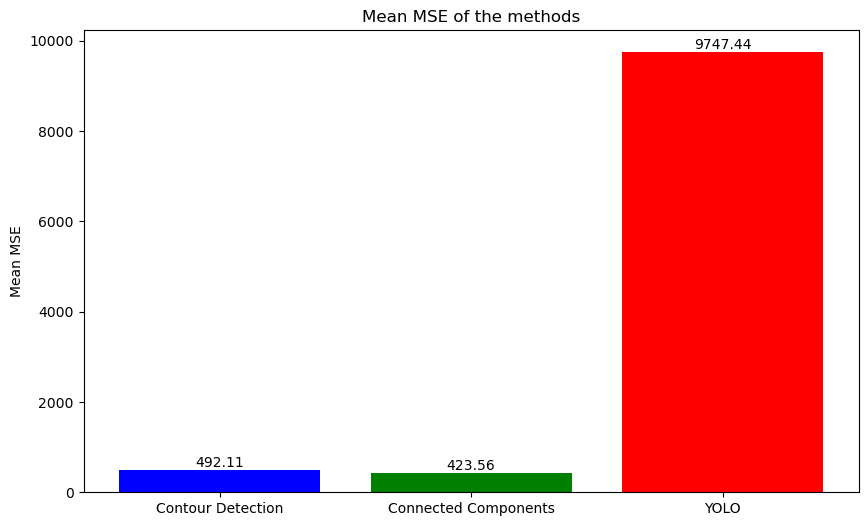

In [39]:
mean_mse_contour = final_combined_eval['mse_contour'].mean()
mean_mse_connected = final_combined_eval['mse_connected'].mean()
mean_mse_yolo = final_combined_eval['mse_yolo'].mean()

mse_data = pd.DataFrame({
    'Method': ['Contour Detection', 'Connected Components', 'YOLO'],
    'Mean MSE': [mean_mse_contour, mean_mse_connected, mean_mse_yolo]
})

fig, ax = plt.subplots(figsize=(10, 6))
bars = ax.bar(mse_data['Method'], mse_data['Mean MSE'], color=['blue', 'green', 'red'])

for bar in bars:
    yval = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2, yval + 0.05, round(yval, 2), ha='center', va='bottom')

ax.set_title('Mean MSE of the methods')
ax.set_ylabel('Mean MSE')
plt.show()